TASK 1: DATA COLLECTION
- Obtain KITTI, COCO, or Open Images dataset
- Ensure labeled bounding boxes for:
  * Pedestrians
  * Vehicles
  * Traffic signs
  * Obstacles

In [13]:
# 1: Environment Setup
# Verify environment
import sys
print("Python version:", sys.version)

import azureml.core
print("Azure ML SDK version:", azureml.core.VERSION)

# Import required libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image
import json
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
print(f"Working directory: {os.getcwd()}")

Python version: 3.10.11 (main, May 16 2023, 00:28:57) [GCC 11.2.0]
Azure ML SDK version: 1.60.0
Working directory: /mnt/batch/tasks/shared/LS_root/mounts/clusters/project-objectdetection/code/RealTime_ObjectDetection


In [7]:
# 2: Connect to Azure ML Workspace
from azureml.core import Workspace, Datastore, Dataset

# Auto-connect on compute instance
ws = Workspace.from_config()

print(f"Workspace: {ws.name}")
print(f"Location: {ws.location}")
print(f"Resource group: {ws.resource_group}")
print(f"Subscription ID: {ws.subscription_id}")

# Get default datastore
datastore = ws.get_default_datastore()
print(f"\nDefault datastore: {datastore.name}")
print(f"Storage account: {datastore.account_name}")

Workspace: ml-project-objectdetection
Location: uaenorth
Resource group: depi-project-objectdetection
Subscription ID: c91bbd69-b009-45c6-9d9c-286a8eca0a74

Default datastore: workspaceblobstore
Storage account: depiproject


In [8]:
# 3: Create Project Directory Structure

# Define project structure
project_dirs = [
    'data/raw/kitti',
    'data/processed/train',
    'data/processed/val',
    'data/processed/test',
    'models',
    'reports',
    'documentation'
]

# Create directories
for directory in project_dirs:
    os.makedirs(directory, exist_ok=True)
    print(f"Created: {directory}")

Created: data/raw/kitti
Created: data/processed/train
Created: data/processed/val
Created: data/processed/test
Created: models
Created: reports
Created: documentation


In [9]:
# 4: Download KITTI Dataset
import urllib.request
import zipfile
# KITTI download URLs
KITTI_URLS = {
    'images': 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_image_2.zip',
    'labels': 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_label_2.zip'}

# Download function with progress
def download_with_progress(url, filename):
    def reporthook(count, block_size, total_size):
        percent = int(count * block_size * 100 / total_size)
        mb_downloaded = count * block_size / (1024**2)
        mb_total = total_size / (1024**2)
        print(f"\rProgress: {percent}% [{mb_downloaded:.1f} MB / {mb_total:.1f} MB]", end='')
    urllib.request.urlretrieve(url, filename, reporthook)
    print()

# Download images
images_zip = 'data/raw/kitti/data_object_image_2.zip'
if not os.path.exists(images_zip):
    download_with_progress(KITTI_URLS['images'], images_zip)
    print(" Images downloaded")
else:
    print(" Images already downloaded")

# Download labels
labels_zip = 'data/raw/kitti/data_object_label_2.zip'
if not os.path.exists(labels_zip):
    download_with_progress(KITTI_URLS['labels'], labels_zip)
    print(" Labels downloaded")
else:
    print(" Labels already downloaded")

 Images already downloaded
 Labels already downloaded


In [10]:
# 5: Extract KITTI Dataset
if not os.path.exists('data/raw/kitti/training/image_2'):
    with zipfile.ZipFile(images_zip, 'r') as zip_ref:
        for member in tqdm(zip_ref.namelist(), desc="Extracting images"):
            zip_ref.extract(member, 'data/raw/kitti/')
    print("Images extracted")
else:
    print("Images already extracted")

# Extract labels
if not os.path.exists('data/raw/kitti/training/label_2'):
    with zipfile.ZipFile(labels_zip, 'r') as zip_ref:
        zip_ref.extractall('data/raw/kitti/')
    print("Labels extracted")
else:
    print("Labels already extracted")

# Verify extraction
images_path = 'data/raw/kitti/training/image_2'
labels_path = 'data/raw/kitti/training/label_2'

num_images = len([f for f in os.listdir(images_path) if f.endswith('.png')])
num_labels = len([f for f in os.listdir(labels_path) if f.endswith('.txt')])

print(f"\nFound {num_images} training images")
print(f"Found {num_labels} label files")

Images already extracted
Labels already extracted

Found 7481 training images
Found 7481 label files


In [15]:
#6: Upload KITTI to Azure Blob Storage
datastore.upload(src_dir=images_path,target_path='kitti/training/image_2', overwrite=False,show_progress=True)
datastore.upload(src_dir=labels_path,target_path='kitti/training/label_2',overwrite=False,show_progress=True)
# Register as Azure ML Dataset
kitti_dataset = Dataset.File.from_files(path=[(datastore, 'kitti/training')])

kitti_dataset = kitti_dataset.register(
    workspace=ws,
    name='kitti-object-detection',
    description='KITTI 2D Object Detection Dataset',
    tags={'project': 'autonomous-vehicles', 'milestone': '1'},
    create_new_version=True
)
print(f"Dataset registered: {kitti_dataset.name} (v{kitti_dataset.version})")

"Datastore.upload" is deprecated after version 1.0.69. Please use "Dataset.File.upload_directory" to upload your files             from a local directory and create FileDataset in single method call. See Dataset API change notice at https://aka.ms/dataset-deprecation.


Uploading an estimated of 7481 files
Uploading data/raw/kitti/training/image_2/000000.png
Uploaded data/raw/kitti/training/image_2/000000.png, 1 files out of an estimated total of 7481
Uploading data/raw/kitti/training/image_2/000001.png
Uploaded data/raw/kitti/training/image_2/000001.png, 2 files out of an estimated total of 7481
Uploading data/raw/kitti/training/image_2/000002.png
Uploaded data/raw/kitti/training/image_2/000002.png, 3 files out of an estimated total of 7481
Uploading data/raw/kitti/training/image_2/000003.png
Uploaded data/raw/kitti/training/image_2/000003.png, 4 files out of an estimated total of 7481
Uploading data/raw/kitti/training/image_2/000004.png
Uploaded data/raw/kitti/training/image_2/000004.png, 5 files out of an estimated total of 7481
Uploading data/raw/kitti/training/image_2/000005.png
Uploaded data/raw/kitti/training/image_2/000005.png, 6 files out of an estimated total of 7481
Uploading data/raw/kitti/training/image_2/000006.png
Uploaded data/raw/kitt

TASK 2: DATA EXPLORATION
- Analyze distribution of object classes
- Investigate data quality (resolution, label accuracy)
- Check for biases or imbalances
- Analyze environmental factors (lighting, weather, road types)

In [11]:
#7: Parse KITTI Annotations

def parse_kitti_annotation(annotation_line):
    parts = annotation_line.strip().split()
    
    if len(parts) < 15:
        return None
    
    return {
        'type': parts[0],
        'truncated': float(parts[1]),
        'occluded': int(parts[2]),
        'alpha': float(parts[3]),
        'bbox': {'left': float(parts[4]),'top': float(parts[5]),'right': float(parts[6]),'bottom': float(parts[7])},
        'dimensions': {'height': float(parts[8]),'width': float(parts[9]),'length': float(parts[10])},
        'location': {'x': float(parts[11]),'y': float(parts[12]),'z': float(parts[13])},
        'rotation_y': float(parts[14])
    }

print("✓ KITTI annotation parser ready")

✓ KITTI annotation parser ready


In [14]:
# 8: Analyze Object Class Distribution
# Count objects by class
class_counts = {}
total_objects = 0
images_with_objects = 0

for label_file in tqdm(os.listdir(labels_path), desc="Analyzing labels"):
    if label_file.endswith('.txt'):
        label_file_path = os.path.join(labels_path, label_file)
        
        has_objects = False
        with open(label_file_path, 'r') as f:
            for line in f.readlines():
                obj = parse_kitti_annotation(line)
                if obj:
                    obj_type = obj['type']
                    class_counts[obj_type] = class_counts.get(obj_type, 0) + 1
                    total_objects += 1
                    has_objects = True
        
        if has_objects:
            images_with_objects += 1

# Display results
print(f"\nTotal images: {num_images}")
print(f"Images with objects: {images_with_objects}")
print(f"Total objects annotated: {total_objects}")
print(f"Average objects per image: {total_objects/num_images:.2f}")

sorted_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
for obj_class, count in sorted_classes:
    percentage = (count / total_objects) * 100
    print(f"{obj_class:<20} {count:>7} ({percentage:>5.2f}%)")

# Save to DataFrame
class_dist_df = pd.DataFrame(sorted_classes, columns=['Class', 'Count'])
class_dist_df['Percentage'] = (class_dist_df['Count'] / total_objects * 100).round(2)
class_dist_df.to_csv('reports/class_distribution.csv', index=False)

Analyzing labels: 100%|██████████| 7481/7481 [03:14<00:00, 38.55it/s]



Total images: 7481
Images with objects: 7481
Total objects annotated: 51865
Average objects per image: 6.93
Car                    28742 (55.42%)
DontCare               11295 (21.78%)
Pedestrian              4487 ( 8.65%)
Van                     2914 ( 5.62%)
Cyclist                 1627 ( 3.14%)
Truck                   1094 ( 2.11%)
Misc                     973 ( 1.88%)
Tram                     511 ( 0.99%)
Person_sitting           222 ( 0.43%)


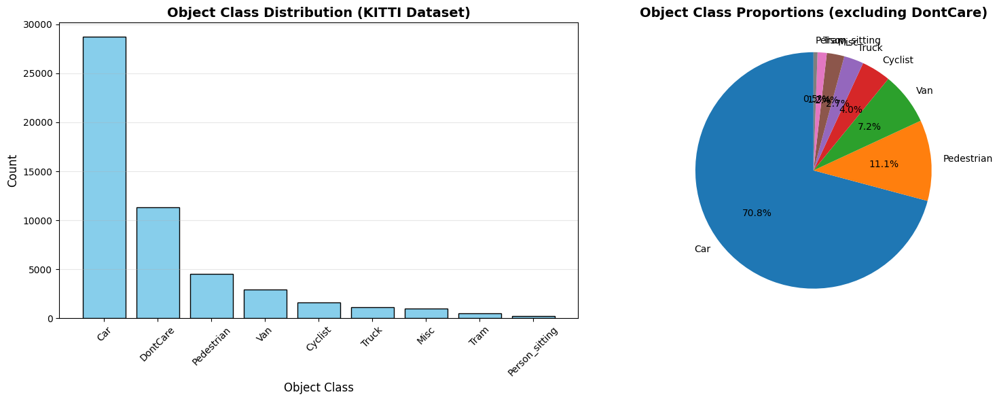

In [15]:
# 9: Visualize Class Distribution
# Create visualizations
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
axes[0].bar(class_dist_df['Class'], class_dist_df['Count'], color='skyblue', edgecolor='black')
axes[0].set_xlabel('Object Class', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_title('Object Class Distribution (KITTI Dataset)', fontsize=14, fontweight='bold')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', alpha=0.3)

# Pie chart (exclude DontCare)
plot_data = class_dist_df[class_dist_df['Class'] != 'DontCare']
axes[1].pie(plot_data['Count'], labels=plot_data['Class'], autopct='%1.1f%%', startangle=90)
axes[1].set_title('Object Class Proportions (excluding DontCare)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('reports/class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

Analyzing image quality: 100%|██████████| 1000/1000 [00:55<00:00, 18.12it/s]



Image Resolution Statistics:
--------------------------------------------------
             Width       Height  Aspect_Ratio
count  1000.000000  1000.000000   1000.000000
mean   1240.176000   374.560000      3.311019
std       5.101671     1.450691      0.002618
min    1224.000000   370.000000      3.300532
25%    1242.000000   375.000000      3.312000
50%    1242.000000   375.000000      3.312000
75%    1242.000000   375.000000      3.312000
max    1242.000000   376.000000      3.312000


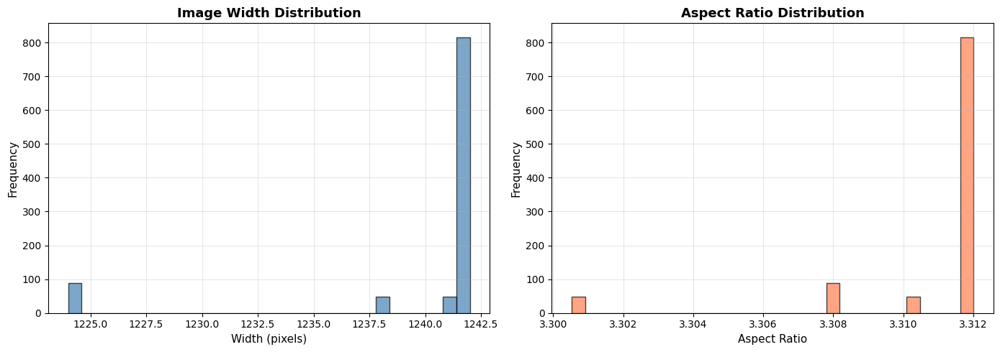

In [16]:
# 10: Analyze Image Quality & Resolution
# Sample images for analysis
sample_size = min(1000, num_images)
image_files = [f for f in os.listdir(images_path) if f.endswith('.png')][:sample_size]

resolutions = []
aspect_ratios = []

for img_file in tqdm(image_files, desc="Analyzing image quality"):
    img = Image.open(os.path.join(images_path, img_file))
    width, height = img.size
    resolutions.append((width, height))
    aspect_ratios.append(width / height)

# Convert to DataFrame
quality_df = pd.DataFrame(resolutions, columns=['Width', 'Height'])
quality_df['Aspect_Ratio'] = aspect_ratios

print(f"\nImage Resolution Statistics:")
print("-" * 50)
print(quality_df.describe())

# Plot resolution distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(quality_df['Width'], bins=30, color='steelblue', alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Width (pixels)', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[0].set_title('Image Width Distribution', fontsize=13, fontweight='bold')
axes[0].grid(alpha=0.3)

axes[1].hist(quality_df['Aspect_Ratio'], bins=30, color='coral', alpha=0.7, edgecolor='black')
axes[1].set_xlabel('Aspect Ratio', fontsize=11)
axes[1].set_ylabel('Frequency', fontsize=11)
axes[1].set_title('Aspect Ratio Distribution', fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('reports/image_quality_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

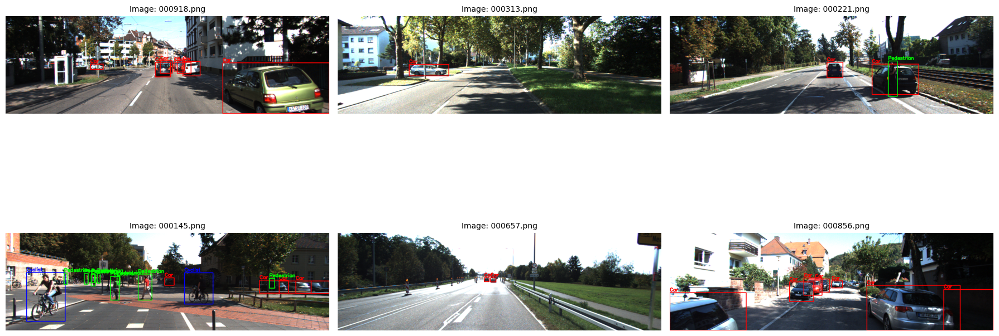

In [17]:
#11: Visualize Sample Images with Annotations
def draw_bounding_boxes(image_path, label_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Define colors for different classes
    colors = {'Car': (255, 0, 0),
              'Pedestrian': (0, 255, 0),
              'Cyclist': (0, 0, 255),
              'Van': (255, 255, 0),
              'Truck': (255, 0, 255),
              'Tram': (0, 255, 255)}
    
    with open(label_path, 'r') as f:
        for line in f.readlines():
            obj = parse_kitti_annotation(line)
            if obj and obj['type'] in colors:
                bbox = obj['bbox']
                left = int(bbox['left'])
                top = int(bbox['top'])
                right = int(bbox['right'])
                bottom = int(bbox['bottom'])
                
                color = colors[obj['type']]
                cv2.rectangle(img, (left, top), (right, bottom), color, 2)
                cv2.putText(img, obj['type'], (left, top-5), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    return img

# Visualize sample images
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

sample_indices = np.random.choice(len(image_files), 6, replace=False)

for idx, ax in enumerate(axes):
    img_file = image_files[sample_indices[idx]]
    label_file = img_file.replace('.png', '.txt')
    
    img_path = os.path.join(images_path, img_file)
    label_path = os.path.join(labels_path, label_file)
    
    if os.path.exists(label_path):
        annotated_img = draw_bounding_boxes(img_path, label_path)
        ax.imshow(annotated_img)
        ax.set_title(f"Image: {img_file}", fontsize=10)
        ax.axis('off')

plt.tight_layout()
plt.savefig('reports/sample_annotated_images.png', dpi=150, bbox_inches='tight')
plt.show()

Analyzing brightness: 100%|██████████| 1000/1000 [01:23<00:00, 11.92it/s]


Medium (Cloudy/Shadow)      987 ( 98.7%)
Low (Night/Dark)             11 (  1.1%)
High (Bright/Daylight)        2 (  0.2%)


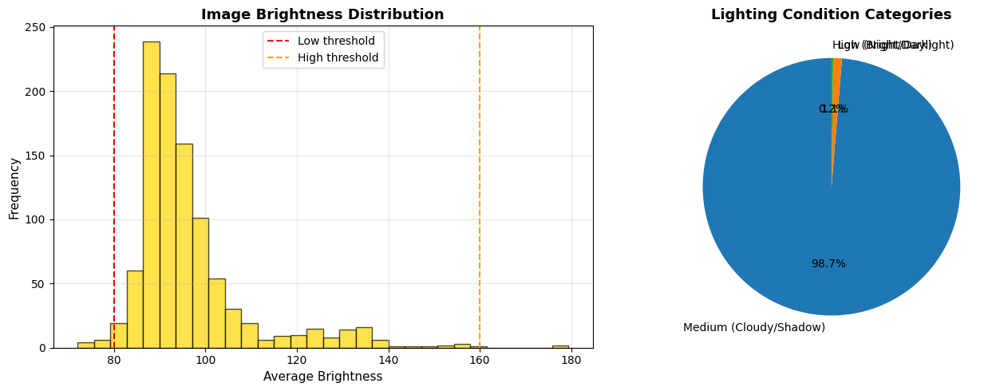

In [19]:
# 12: Analyze Environmental Factors
# Analyze brightness levels
brightness_levels = []
for img_file in tqdm(image_files[:], desc="Analyzing brightness"):
    img = cv2.imread(os.path.join(images_path, img_file), cv2.IMREAD_GRAYSCALE)
    brightness = np.mean(img)
    brightness_levels.append(brightness)

# Categorize brightness
def categorize_brightness(value):
    if value < 80:
        return 'Low (Night/Dark)'
    elif value < 160:
        return 'Medium (Cloudy/Shadow)'
    else:
        return 'High (Bright/Daylight)'

brightness_categories = [categorize_brightness(b) for b in brightness_levels]
brightness_dist = pd.Series(brightness_categories).value_counts()
for category, count in brightness_dist.items():
    percentage = (count / len(brightness_levels)) * 100
    print(f"{category:<25} {count:>5} ({percentage:>5.1f}%)")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(brightness_levels, bins=30, color='gold', alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Average Brightness', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[0].set_title('Image Brightness Distribution', fontsize=13, fontweight='bold')
axes[0].axvline(80, color='red', linestyle='--', label='Low threshold')
axes[0].axvline(160, color='orange', linestyle='--', label='High threshold')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].pie(brightness_dist.values, labels=brightness_dist.index, autopct='%1.1f%%', startangle=90)
axes[1].set_title('Lighting Condition Categories', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig('reports/environmental_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

TASK 3: PREPROCESSING
- Resize images to consistent size
- Normalize pixel values
- Perform data augmentation:
  * Random cropping
  * Flipping
  * Rotation
- Simulate different driving conditions

In [20]:
# 13: Image Resizing to 640×640 (YOLOv11 Optimized)
import shutil
output_dirs = {
    'images': 'data/processed/resized/images',
    'labels': 'data/processed/resized/labels'
}

for dir_path in output_dirs.values():
    os.makedirs(dir_path, exist_ok=True)

# YOLOv11 optimal size: 640x640
TARGET_SIZE = (640, 640)
image_files = [f for f in os.listdir(images_path) if f.endswith('.png')]

for img_file in tqdm(image_files, desc="Resizing images"):
    img = Image.open(os.path.join(images_path, img_file))
    
    # High-quality resize for better detection accuracy
    img_resized = img.resize(TARGET_SIZE, Image.Resampling.LANCZOS)
    
    output_path = os.path.join(output_dirs['images'], img_file)
    img_resized.save(output_path, 'PNG', optimize=True)
    
    # Copy corresponding label
    label_file = img_file.replace('.png', '.txt')
    label_src = os.path.join(labels_path, label_file)
    label_dst = os.path.join(output_dirs['labels'], label_file)
    
    if os.path.exists(label_src):
        shutil.copy2(label_src, label_dst)

print(f"\n✓ Resized {len(image_files)} images")
print(f"✓ New size: {TARGET_SIZE[0]}x{TARGET_SIZE[1]} pixels (YOLOv11 optimized)")
print(f"✓ Original KITTI: ~1242x375 → YOLOv11: 640x640")

Resizing images: 100%|██████████| 7481/7481 [1:01:18<00:00,  2.03it/s]


✓ Resized 7481 images
✓ New size: 640x640 pixels (YOLOv11 optimized)
✓ Original KITTI: ~1242x375 → YOLOv11: 640x640


In [21]:
# 14: Pixel Normalization
# Calculating dataset mean and std

sample_size = min(1000, len(image_files))
sample_images = np.random.choice(image_files, sample_size, replace=False)

pixel_values = []

for img_file in tqdm(sample_images[:100], desc="Sampling images"):
    img = Image.open(os.path.join(output_dirs['images'], img_file))
    img_array = np.array(img) / 255.0
    pixel_values.append(img_array.reshape(-1, 3))

pixel_values = np.vstack(pixel_values)

dataset_mean = pixel_values.mean(axis=0)
dataset_std = pixel_values.std(axis=0)

print(f"Mean: [{dataset_mean[0]:.4f}, {dataset_mean[1]:.4f}, {dataset_mean[2]:.4f}]")
print(f"Std:  [{dataset_std[0]:.4f}, {dataset_std[1]:.4f}, {dataset_std[2]:.4f}]")

# normalizing using z-score normalization
norm_params = {
    'mean': dataset_mean.tolist(),
    'std': dataset_std.tolist(),
    'method': 'z-score'}

with open('data/processed/normalization_params.json', 'w') as f:
    json.dump(norm_params, f, indent=2)

Sampling images: 100%|██████████| 100/100 [00:07<00:00, 13.65it/s]


Mean: [0.3731, 0.3924, 0.3813]
Std:  [0.3169, 0.3225, 0.3267]


In [22]:
# 15: Data Augmentation Setup
augmentation_config = {
    'horizontal_flip': {'enabled': True,'probability': 0.5,'description': 'Flip image left-right'},
    'rotation': {'enabled': True,'angle_range': (-5, 5),'probability': 0.3,'description': 'Small rotations'},
    'brightness': {'enabled': True,'factor_range': (0.7, 1.3),'probability': 0.4,'description': 'Different lighting'},
    'contrast': {'enabled': True,'factor_range': (0.8, 1.2),'probability': 0.3,'description': 'Different weather'},
    'gaussian_noise': {'enabled': True,'mean': 0,'std': 0.01,'probability': 0.2,'description': 'Sensor noise'}
}

for aug_name, config in augmentation_config.items():
    if config['enabled']:
        status = "ENABLED"
        prob = f"p={config['probability']}"
    else:
        status = "DISABLED"
        prob = ""
    
    print(f"{status:<12} {aug_name:<20} {prob:<10}")
    print(f"{config['description']}")

with open('data/processed/augmentation_config.json', 'w') as f:
    json.dump(augmentation_config, f, indent=2)

print("\n Augmentation config done")

ENABLED      horizontal_flip      p=0.5     
Flip image left-right
ENABLED      rotation             p=0.3     
Small rotations
ENABLED      brightness           p=0.4     
Different lighting
ENABLED      contrast             p=0.3     
Different weather
ENABLED      gaussian_noise       p=0.2     
Sensor noise

 Augmentation config done


In [27]:
# 16: Implement Augmentation Functions
import random

def augment_image(image, bboxes=None):
    img = np.array(image)
    h, w = img.shape[:2]
    
    aug_bboxes = bboxes.copy() if bboxes is not None else None
    
    # Horizontal Flip
    if random.random() < augmentation_config['horizontal_flip']['probability']:
        img = cv2.flip(img, 1)
        if aug_bboxes is not None:
            for bbox in aug_bboxes:
                x1, y1, x2, y2 = bbox
                bbox[0] = w - x2
                bbox[2] = w - x1
    
    # Rotation
    if random.random() < augmentation_config['rotation']['probability']:
        angle_range = augmentation_config['rotation']['angle_range']
        angle = random.uniform(angle_range[0], angle_range[1])
        
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        img = cv2.warpAffine(img, M, (w, h), 
                            flags=cv2.INTER_LINEAR,
                            borderMode=cv2.BORDER_REFLECT)
    
    # Brightness
    if random.random() < augmentation_config['brightness']['probability']:
        factor_range = augmentation_config['brightness']['factor_range']
        factor = random.uniform(factor_range[0], factor_range[1])
        img = np.clip(img * factor, 0, 255).astype(np.uint8)
    
    # Contrast
    if random.random() < augmentation_config['contrast']['probability']:
        factor_range = augmentation_config['contrast']['factor_range']
        factor = random.uniform(factor_range[0], factor_range[1])
        mean = img.mean()
        img = np.clip((img - mean) * factor + mean, 0, 255).astype(np.uint8)
    
    # Gaussian noise
    if random.random() < augmentation_config['gaussian_noise']['probability']:
        noise = np.random.normal(
            augmentation_config['gaussian_noise']['mean'],
            augmentation_config['gaussian_noise']['std'] * 255,
            img.shape
        )
        img = np.clip(img + noise, 0, 255).astype(np.uint8)
    
    return Image.fromarray(img), aug_bboxes
    print("aug function done")

In [26]:
# 17: Generate Augmented Dataset
aug_output_dir = 'data/processed/augmented'
os.makedirs(f"{aug_output_dir}/images", exist_ok=True)
os.makedirs(f"{aug_output_dir}/labels", exist_ok=True)

NUM_AUGMENTATIONS_PER_IMAGE = 2
total_images = len(image_files)

print(f"\nOriginal images: {total_images}")
print(f"Augmentations per image: {NUM_AUGMENTATIONS_PER_IMAGE}")
print(f"Total augmented: {total_images * NUM_AUGMENTATIONS_PER_IMAGE}")

for img_file in tqdm(image_files, desc="Copying originals"):
    src_img = os.path.join(output_dirs['images'], img_file)
    dst_img = os.path.join(f"{aug_output_dir}/images", img_file)
    shutil.copy2(src_img, dst_img)
    
    label_file = img_file.replace('.png', '.txt')
    src_label = os.path.join(output_dirs['labels'], label_file)
    dst_label = os.path.join(f"{aug_output_dir}/labels", label_file)
    if os.path.exists(src_label):
        shutil.copy2(src_label, dst_label)

augmented_count = 0

for img_file in tqdm(image_files[:500], desc="Augmenting sample"):
    img_path = os.path.join(output_dirs['images'], img_file)
    img = Image.open(img_path)
    
    label_file = img_file.replace('.png', '.txt')
    label_path = os.path.join(output_dirs['labels'], label_file)
    
    for aug_idx in range(NUM_AUGMENTATIONS_PER_IMAGE):
        aug_img, _ = augment_image(img)
        
        base_name = img_file.replace('.png', '')
        aug_img_name = f"{base_name}_aug{aug_idx}.png"
        aug_img_path = os.path.join(f"{aug_output_dir}/images", aug_img_name)
        aug_img.save(aug_img_path, 'PNG')
        
        if os.path.exists(label_path):
            aug_label_name = f"{base_name}_aug{aug_idx}.txt"
            aug_label_path = os.path.join(f"{aug_output_dir}/labels", aug_label_name)
            shutil.copy2(label_path, aug_label_path)
        
        augmented_count += 1

print(f"\n Generated {augmented_count} augmented images")
print(f" Total: {len(os.listdir(f'{aug_output_dir}/images'))} images")


Original images: 7481
Augmentations per image: 2
Total augmented: 14962


Augmenting sample: 100%|██████████| 500/500 [05:19<00:00,  1.57it/s]



 Generated 1000 augmented images
 Total: 8481 images


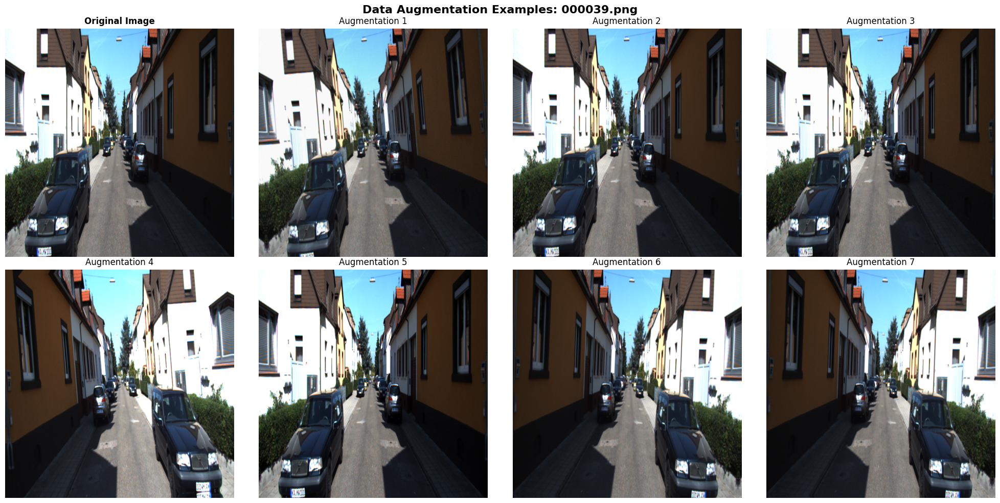

In [28]:
#18: Visualize Augmentation Examples

sample_img_file = random.choice(image_files[:100])
sample_img_path = os.path.join(output_dirs['images'], sample_img_file)
original_img = Image.open(sample_img_path)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()

axes[0].imshow(original_img)
axes[0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0].axis('off')

for idx in range(1, 8):
    aug_img, _ = augment_image(original_img)
    axes[idx].imshow(aug_img)
    axes[idx].set_title(f'Augmentation {idx}', fontsize=12)
    axes[idx].axis('off')

plt.suptitle(f'Data Augmentation Examples: {sample_img_file}', 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig('reports/augmentation_examples.png', dpi=150, bbox_inches='tight')
plt.show()

Data spliting and storage in Azure to be accessable

In [29]:
# 19: Split Dataset (70/15/15)
from sklearn.model_selection import train_test_split

all_images = [f for f in os.listdir(f"{aug_output_dir}/images") if f.endswith('.png')]
total_images = len(all_images)

print(f"\nTotal images: {total_images}")

train_ratio = 0.70
val_ratio = 0.15
test_ratio = 0.15

train_val_images, test_images = train_test_split(
    all_images, 
    test_size=test_ratio, 
    random_state=42,
    shuffle=True
)

val_size_adjusted = val_ratio / (train_ratio + val_ratio)
train_images, val_images = train_test_split(
    train_val_images,
    test_size=val_size_adjusted,
    random_state=42,
    shuffle=True
)
print(f"Training:{len(train_images):>6} images ({len(train_images)/total_images*100:.1f}%)")
print(f"Validation:{len(val_images):>6} images ({len(val_images)/total_images*100:.1f}%)")
print(f"Test:{len(test_images):>6} images ({len(test_images)/total_images*100:.1f}%)")

assert len(train_images) + len(val_images) + len(test_images) == total_images


Total images: 8481
Training:  5936 images (70.0%)
Validation:  1272 images (15.0%)
Test:  1273 images (15.0%)


In [30]:
# 20: Organize Split Dataset

splits = {'train': train_images,
          'val': val_images,
          'test': test_images}

for split_name, image_list in splits.items():
    split_img_dir = f"data/processed/{split_name}/images"
    split_label_dir = f"data/processed/{split_name}/labels"
    os.makedirs(split_img_dir, exist_ok=True)
    os.makedirs(split_label_dir, exist_ok=True)
    
    print(f"\nCopying {split_name} set ({len(image_list)} images)...")
    
    for img_file in tqdm(image_list, desc=f"Copying {split_name}"):
        src_img = os.path.join(f"{aug_output_dir}/images", img_file)
        dst_img = os.path.join(split_img_dir, img_file)
        shutil.copy2(src_img, dst_img)
        
        label_file = img_file.replace('.png', '.txt')
        src_label = os.path.join(f"{aug_output_dir}/labels", label_file)
        dst_label = os.path.join(split_label_dir, label_file)
        
        if os.path.exists(src_label):
            shutil.copy2(src_label, dst_label)


Copying train set (5936 images)...


Copying train: 100%|██████████| 5936/5936 [24:02<00:00,  4.11it/s]



Copying val set (1272 images)...


Copying val: 100%|██████████| 1272/1272 [04:59<00:00,  4.25it/s]



Copying test set (1273 images)...


Copying test: 100%|██████████| 1273/1273 [05:00<00:00,  4.24it/s]


In [31]:
# 21: Upload to Azure & Final Summary
from datetime import datetime

datastore.upload(
    src_dir='data/processed/train',
    target_path='kitti/processed/train',
    overwrite=True,
    show_progress=True
)
print("Train data finished")

datastore.upload(
    src_dir='data/processed/val',
    target_path='kitti/processed/val',
    overwrite=True,
    show_progress=True
)
print("Validation data finished")

datastore.upload(
    src_dir='data/processed/test',
    target_path='kitti/processed/test',
    overwrite=True,
    show_progress=True
)
print("Test data finished")

train_dataset = Dataset.File.from_files(
    path=[(datastore, 'kitti/processed/train')]
)
train_dataset = train_dataset.register(
    workspace=ws,
    name='kitti-train-processed',
    description='KITTI Training Set - Preprocessed',
    tags={'milestone': '1', 'split': 'train'},
    create_new_version=True
)

"Datastore.upload" is deprecated after version 1.0.69. Please use "Dataset.File.upload_directory" to upload your files             from a local directory and create FileDataset in single method call. See Dataset API change notice at https://aka.ms/dataset-deprecation.


Uploading an estimated of 11872 files
Uploading data/processed/train/images/000000.png
Uploaded data/processed/train/images/000000.png, 1 files out of an estimated total of 11872
Uploading data/processed/train/images/000000_aug0.png
Uploaded data/processed/train/images/000000_aug0.png, 2 files out of an estimated total of 11872
Uploading data/processed/train/images/000000_aug1.png
Uploaded data/processed/train/images/000000_aug1.png, 3 files out of an estimated total of 11872
Uploading data/processed/train/images/000001.png
Uploaded data/processed/train/images/000001.png, 4 files out of an estimated total of 11872
Uploading data/processed/train/images/000001_aug0.png
Uploaded data/processed/train/images/000001_aug0.png, 5 files out of an estimated total of 11872
Uploading data/processed/train/images/000001_aug1.png
Uploaded data/processed/train/images/000001_aug1.png, 6 files out of an estimated total of 11872
Uploading data/processed/train/images/000002.png
Uploaded data/processed/tra